In [ ]:
from skimage.exposure import histogram as imhist
from skimage.exposure import equalize_hist
from skimage.filters import gaussian
from skimage.filters.rank import median
from pylab import *
import numpy as np
import matplotlib.pyplot as plt
from skimage import img_as_float
from skimage import exposure

In [7]:
def noise_reduction_gaussian(img, sigma=2.0):
    
    if img.ndim == 3:
        img_noise_reduced = gaussian(img, sigma=sigma, preserve_range=True, channel_axis=-1)
    else:
        img_noise_reduced = gaussian(img, sigma=sigma, preserve_range=True)

    #    # Extracción de canales
    R = img_noise_reduced[...,0]
    G = img_noise_reduced[...,1]
    B = img_noise_reduced[...,2]

    #Obtener histograma de canales
    hist_R, bin_centers_R = imhist(R)
    hist_G, bin_centers_G = imhist(G)
    hist_B, bin_centers_B = imhist(B)

    # Obtener lienzos para la imagen sin ruido y su histograma
    _, (ax_image_noise_reduced, ax_hist_noise_reduced) = subplots(1, 2, figsize=(12, 4))
    # Mostrar imagen en el primer lienzo
    ax_image_noise_reduced.imshow(img_noise_reduced, cmap="gray")

    # Mostar histograma en el segundo lienzo
    ax_hist_noise_reduced.fill_between(bin_centers_R, hist_R, alpha=0.2, color="red")
    ax_hist_noise_reduced.fill_between(bin_centers_G, hist_G, alpha=0.2, color="green")
    ax_hist_noise_reduced.fill_between(bin_centers_B, hist_B, alpha=0.2, color="blue")

    ax_hist_noise_reduced.set_xlabel('intensidad')
    ax_hist_noise_reduced.set_ylabel('# pixeles')
    
def noise_reduction_median(img, selem=None):
    if img.ndim == 3:
        return median(img, selem=selem, channel_axis=-1)
    else:
        return median(img, selem=selem)


In [10]:
# Usando la técnica ecualizacion histograma

def equalizacion_histograma(path_image):

    imagen = imread(path_image)

    # Extracción de canales
    R = imagen[...,0]
    G = imagen[...,1]
    B = imagen[...,2]

    #Obtener histograma de canales
    hist_R, bin_centers_R = imhist(R)
    hist_G, bin_centers_G = imhist(G)
    hist_B, bin_centers_B = imhist(B)

    # Ecualizar cada canal
    R_eq = equalize_hist(R)
    G_eq = equalize_hist(G)
    B_eq = equalize_hist(B)

    # Recombinar la imagen ecualizada
    imagen_eq = np.stack((R_eq,G_eq,B_eq),axis=2)

    # Cancelar de ruido
    #img_clean = noise_reduction_average(imagen_eq,7)
    #

    #Obtener histograma de canales de imagene equalizada
    hist_R_eq, bin_centers_R_eq = imhist(R_eq)
    hist_G_eq, bin_centers_G_eq = imhist(G_eq)
    hist_B_eq, bin_centers_B_eq = imhist(B_eq)

    # Obtener lienzos para la imagen y para el histograma
    _, (ax_image, ax_hist) = subplots(1, 2, figsize=(12, 4))

    # Obtener lienzos para la imagen equalizada y para el histograma
    _, (ax_image_eq, ax_hist_eq) = subplots(1, 2, figsize=(12, 4))

    # Mostrar imagen en el primer lienzo
    ax_image.imshow(imagen, cmap="gray")

    # Mostar histograma en el segundo lienzo
    ax_hist.fill_between(bin_centers_R, hist_R, alpha=0.2, color="red")
    ax_hist.fill_between(bin_centers_G, hist_G, alpha=0.2, color="green")
    ax_hist.fill_between(bin_centers_B, hist_B, alpha=0.2, color="blue")

    ax_hist.set_xlabel('intensidad')
    ax_hist.set_ylabel('# pixeles')

    # Mostrar imagen equalizada
    ax_image_eq.imshow(imagen_eq)

    # Mostar histograma de imagen equalizada en el segundo lienzo
    ax_hist_eq.fill_between(bin_centers_R_eq,hist_R_eq,alpha=0.2,color="red")
    ax_hist_eq.fill_between(bin_centers_G_eq,hist_G_eq,alpha=0.2,color="green")
    ax_hist_eq.fill_between(bin_centers_B_eq,hist_B_eq,alpha=0.2,color="blue")

    ax_hist_eq.set_xlabel('intensidad')
    ax_hist_eq.set_ylabel('# pixeles')

    return imagen_eq

# Mostrar imagen


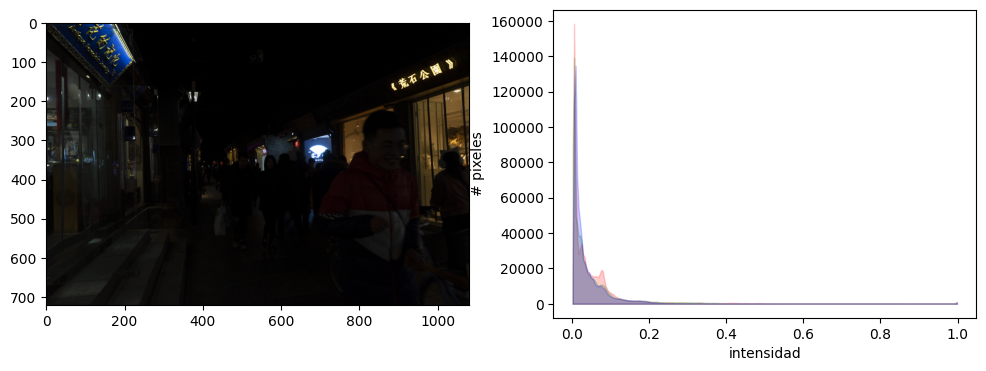

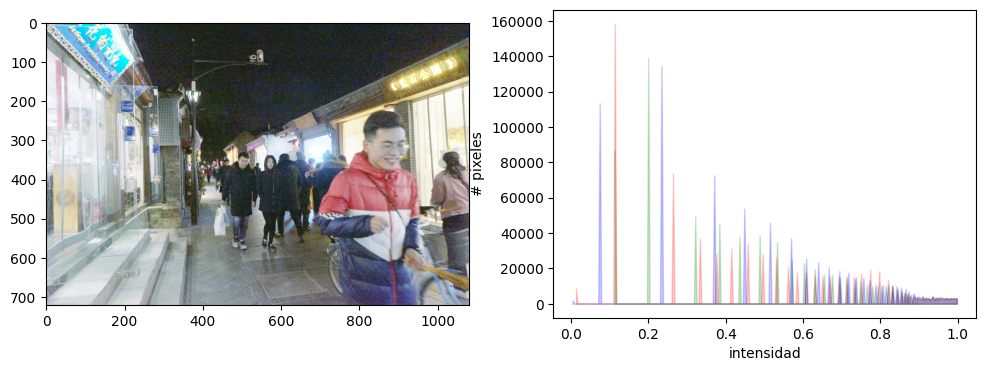

In [20]:
# Primera imagen
equalizacion_histograma("images/1.png")

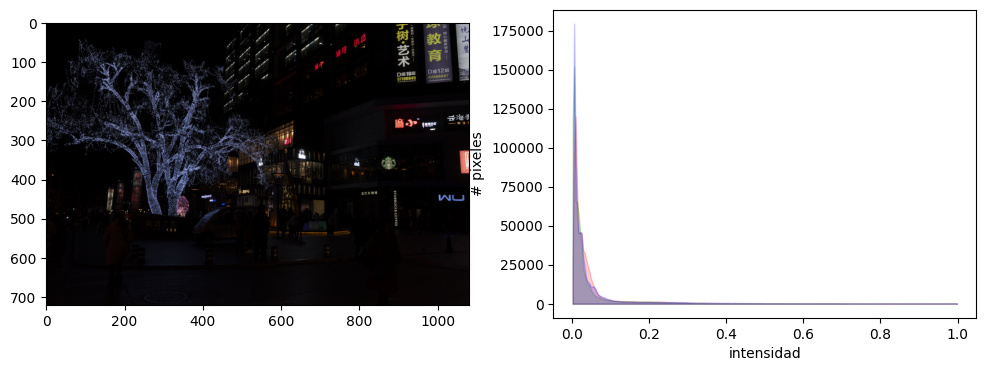

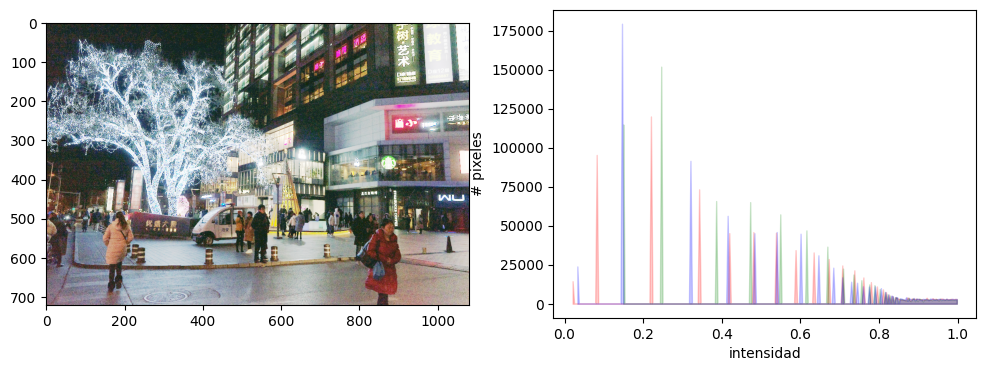

In [21]:
# Segunda imagen
equalizacion_histograma("images/1002.png")

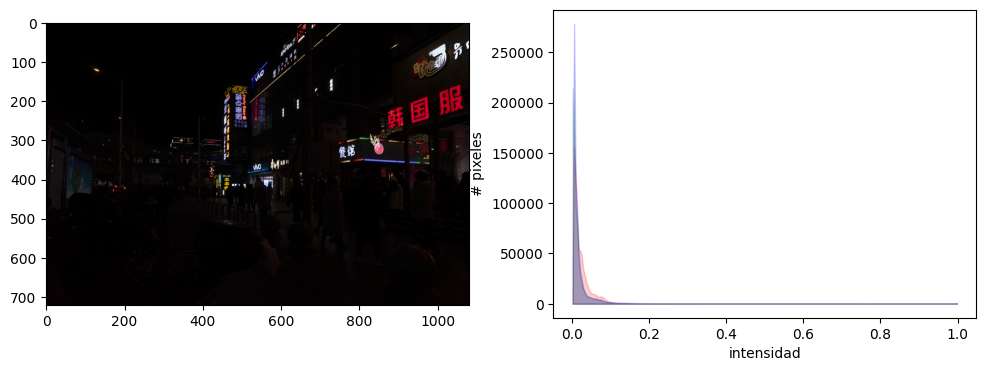

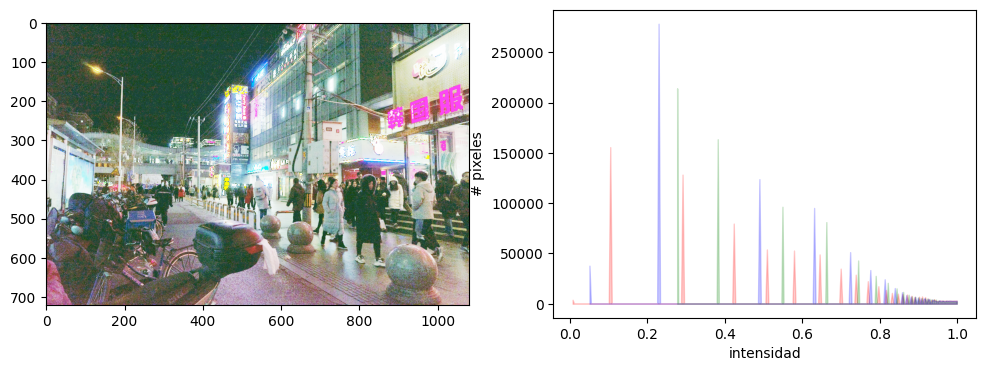

In [22]:
# Tercera imagen
equalizacion_histograma("images/1006.png")

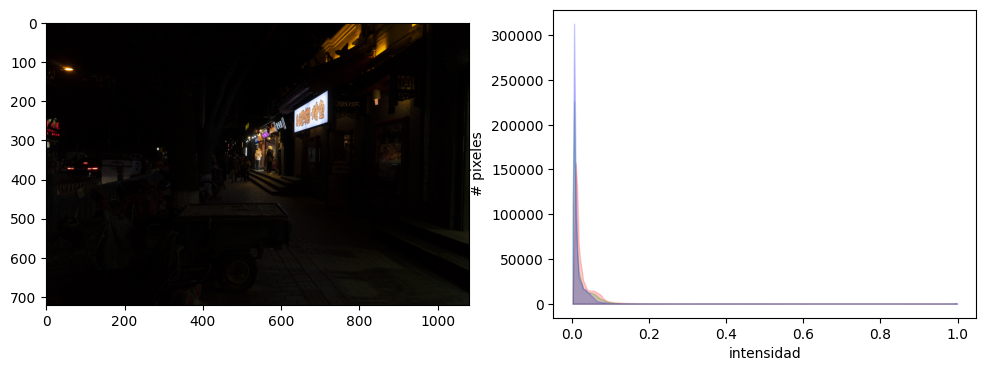

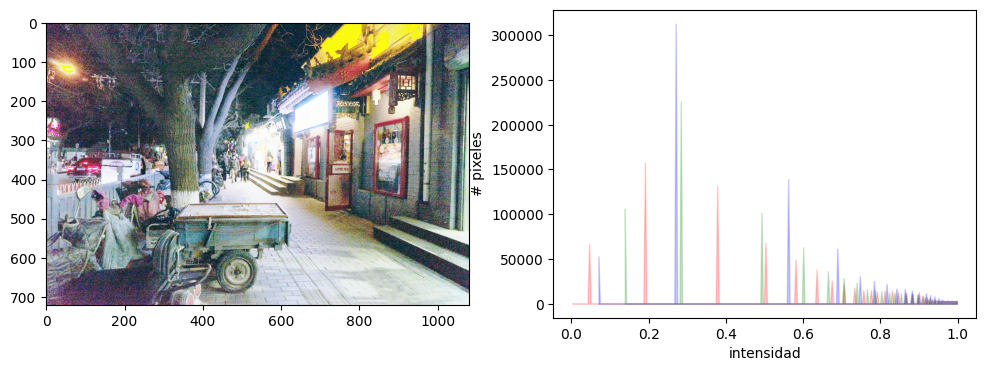

In [23]:
# Cuarta imagen
equalizacion_histograma("images/1011.png")

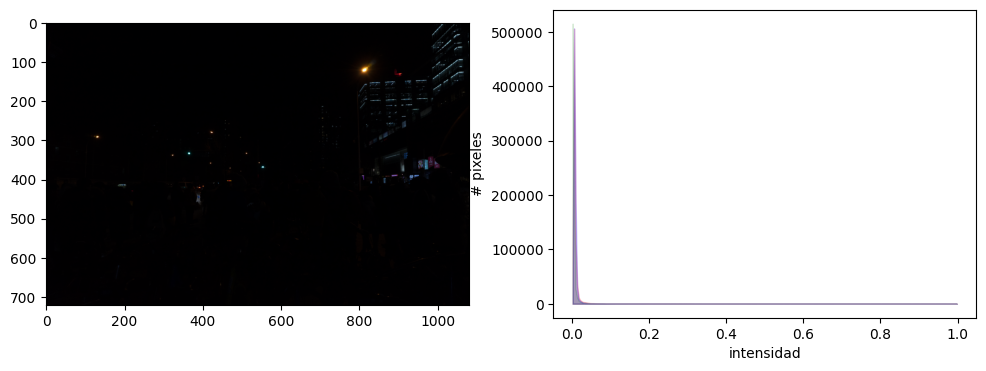

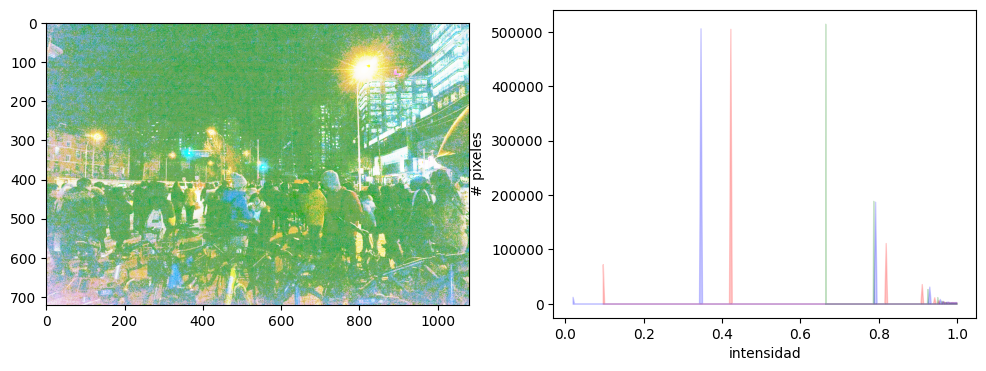

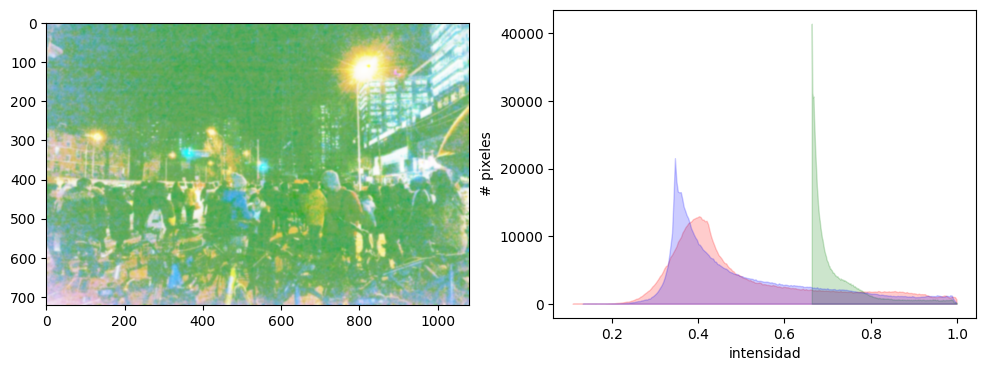

In [11]:
eq = equalizacion_histograma("imagenes/1003.png")
noise_reduction_gaussian(eq)

In [9]:
# Usando la técnica de corrección gamma o ley de potencia

def correccion_gamma(path_image, gamma_value =0.3):
    # Cargando la imagen y convertiendo a flotante
    image_o = imread(path_image)
    image_read = img_as_float(image_o)

    # Aplicando correccion gamma
    gamma = gamma_value
    img_gamma = exposure.adjust_gamma(image_read,gamma)

    # Creando curvas de transformacion
    r = np.linspace(0,1,256)
    s_original = r  # gamma = 1
    s_gamma = np.power(r,gamma)

    # Crear figura con 2 lienzos: original y corregida
    _, (ax_image_o, ax_plot_o) = subplots(1, 2, figsize=(12, 4))
    _, (ax_image_g, ax_plot_g) = subplots(1, 2, figsize=(12, 4))

    # --------- Imagen original ---------
    ax_image_o.imshow(image_o)
    ax_image_o.set_title('Imagen Original')

    ax_plot_o.plot(r, s_original, label='Gamma = 1', color='green')
    ax_plot_o.set_title('Curva de Intensidad Original')
    ax_plot_o.set_xlabel('Intensidad de entrada (r)')
    ax_plot_o.set_ylabel('Intensidad de salida (s)')
    ax_plot_o.grid(True)
    ax_plot_o.legend()

    # --------- Imagen con correccion gamma ---------
    ax_image_g.imshow(img_gamma)
    ax_image_g.set_title(f'Imagen Corregida (Gamma = {gamma})')

    ax_plot_g.plot(r, s_gamma, label=f'Gamma = {gamma}', color='green')
    ax_plot_g.set_title('Curva de Corrección Gamma')
    ax_plot_g.set_xlabel('Intensidad de entrada (r)')
    ax_plot_g.set_ylabel('Intensidad de salida (s)')
    ax_plot_g.grid(True)
    ax_plot_g.legend()


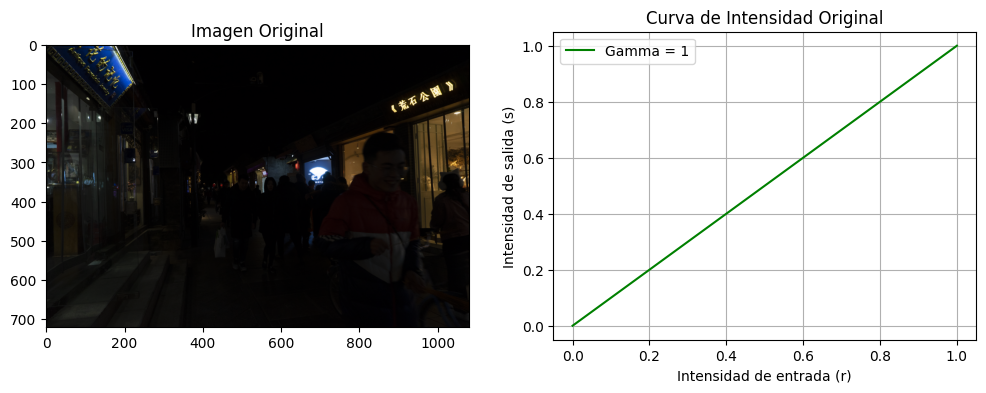

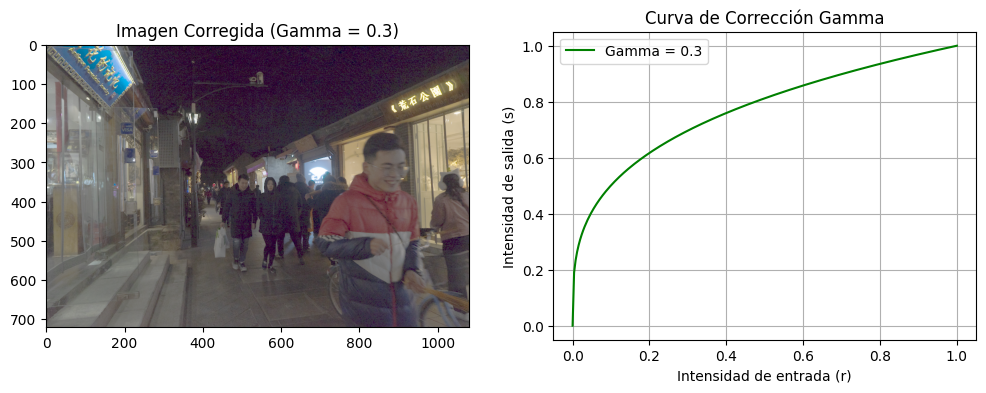

In [64]:
# Para primera imagen
correccion_gamma("images/1.png")

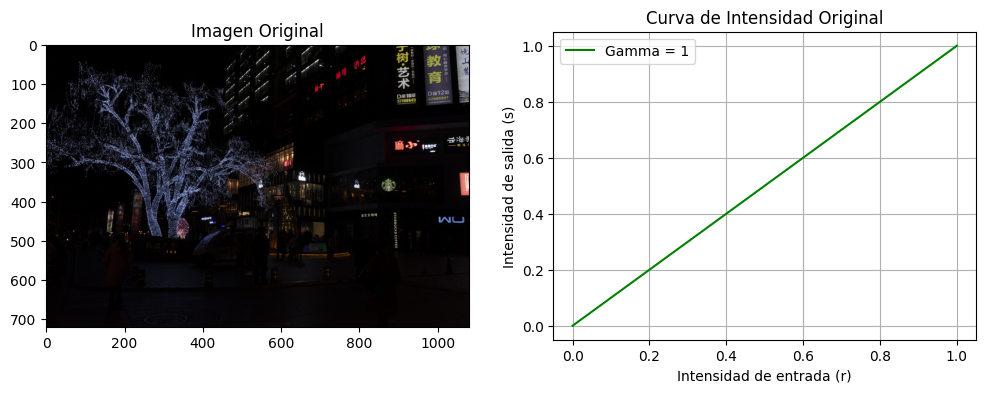

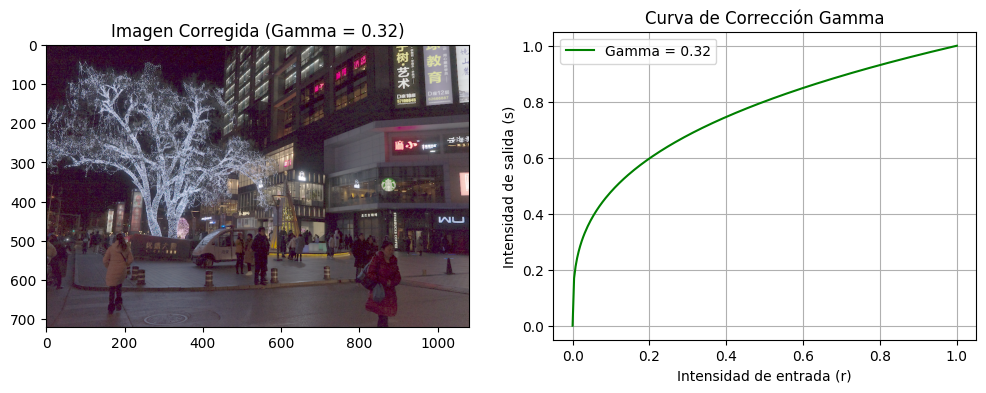

In [60]:
# Para segunda imagen
correccion_gamma("images/1002.png",gamma_value=0.32)

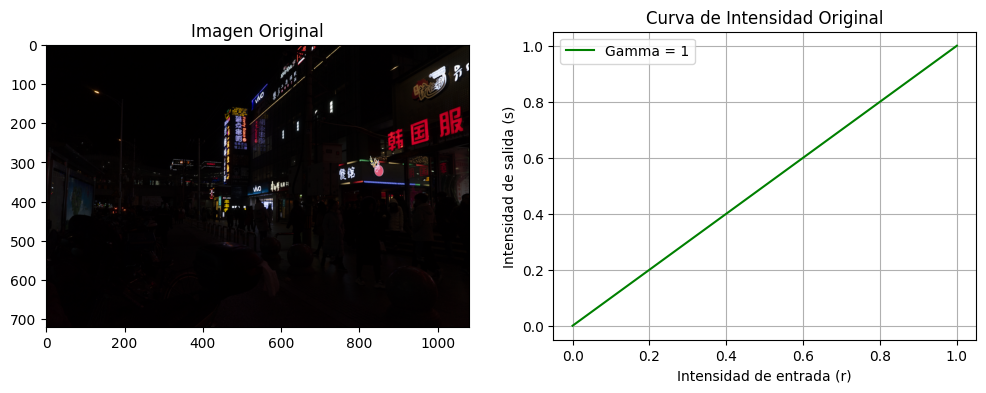

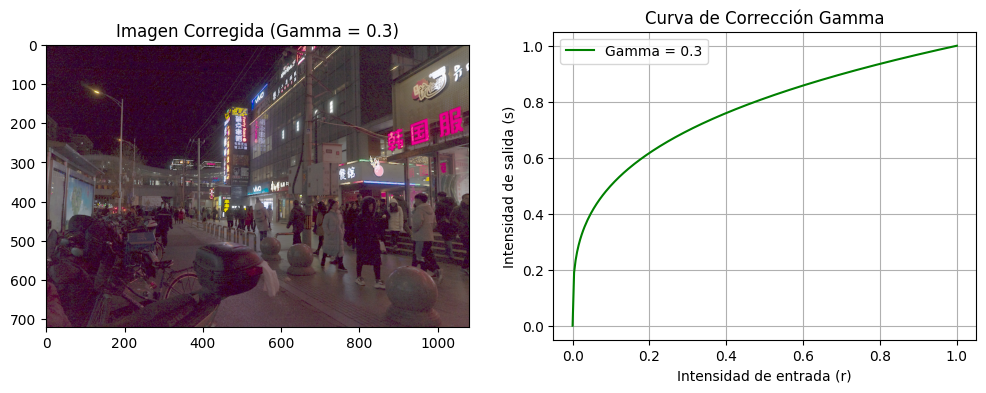

In [54]:
# Para tercera imagen
correccion_gamma("images/1006.png")

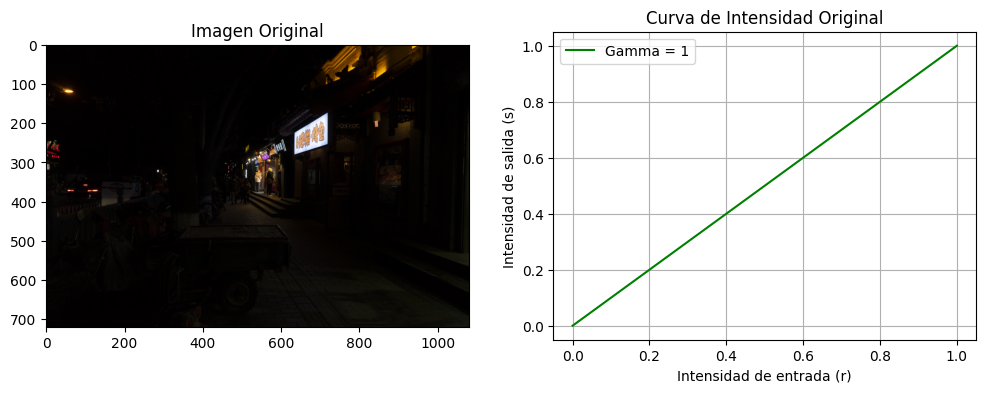

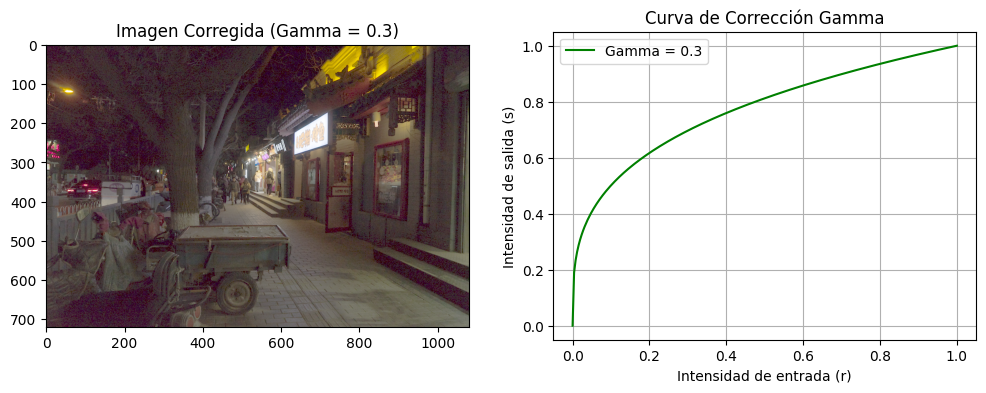

In [55]:
# Para cuarta imagen
correccion_gamma("images/1011.png")

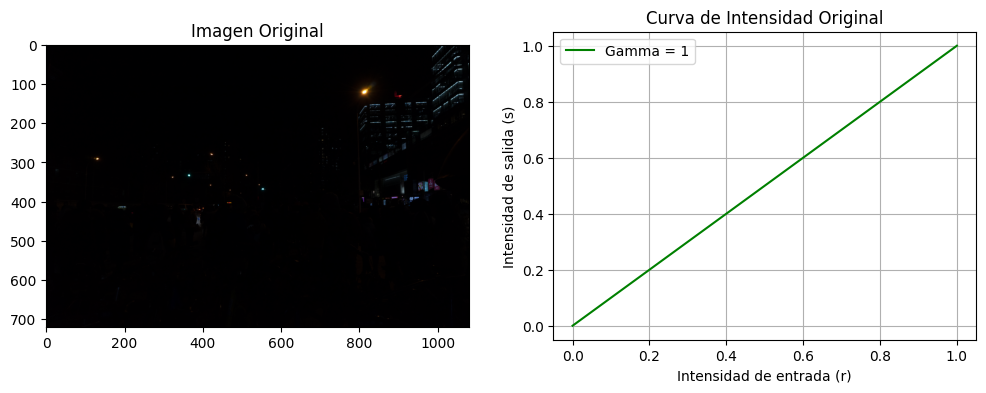

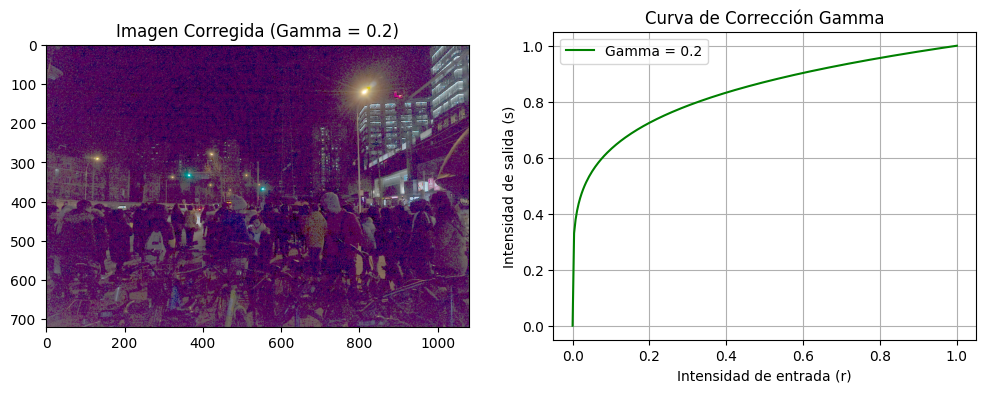

In [38]:
correccion_gamma("images/1003.png",0.2)

In [17]:
# Aplicando la técnica de transformacion logaritmica
def transformacion_logaritmica(path_image,gain_value=1):
    # Cargando la imagen y convertiendo a flotante
    image_o = imread(path_image)
    image_read = img_as_float(image_o)

    # Aplicando correccion gamma
    gain = gain_value
    img_log = exposure.adjust_log(image_read,gain)

    # Creando curvas de transformacion
    r = np.linspace(0,1,256)
    s_original = r  # log = 1
    s_log = gain * np.log1p(r)

    # Crear figura con 2 lienzos: original y corregida
    _, (ax_image_o, ax_plot_o) = subplots(1, 2, figsize=(12, 4))
    _, (ax_image_g, ax_plot_g) = subplots(1, 2, figsize=(12, 4))

    # --------- Imagen original ---------
    ax_image_o.imshow(image_o)
    ax_image_o.set_title('Imagen Original')

    ax_plot_o.plot(r, s_original, color='green')
    ax_plot_o.set_title('Curva de Intensidad Original')
    ax_plot_o.set_xlabel('Intensidad de entrada (r)')
    ax_plot_o.set_ylabel('Intensidad de salida (s)')
    ax_plot_o.grid(True)

    # --------- Imagen con correccion gamma ---------
    ax_image_g.imshow(img_log)
    ax_image_g.set_title(f'Imagen Corregida (Gain = {gain})')

    ax_plot_g.plot(r, s_log, label=f'Gain = {gain}', color='green')
    ax_plot_g.set_title('Curva de Transformacion Logaritmica')
    ax_plot_g.set_xlabel('Intensidad de entrada (r)')
    ax_plot_g.set_ylabel('Intensidad de salida (s)')
    ax_plot_g.grid(True)
    ax_plot_g.legend()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.0].


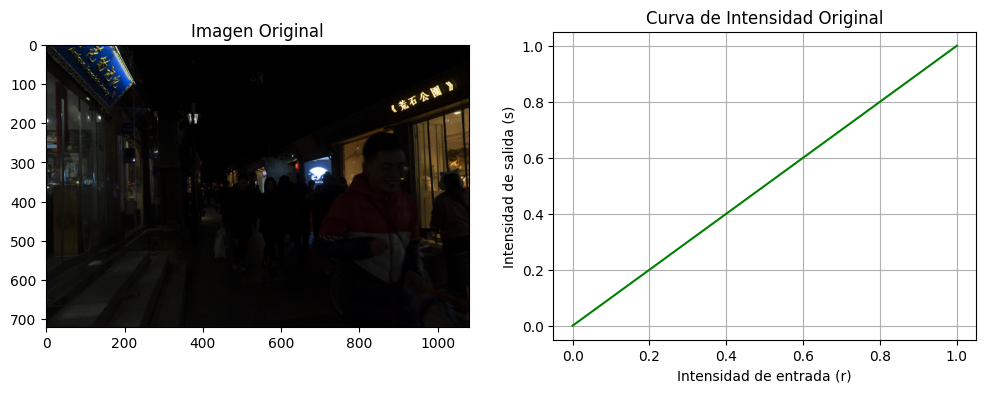

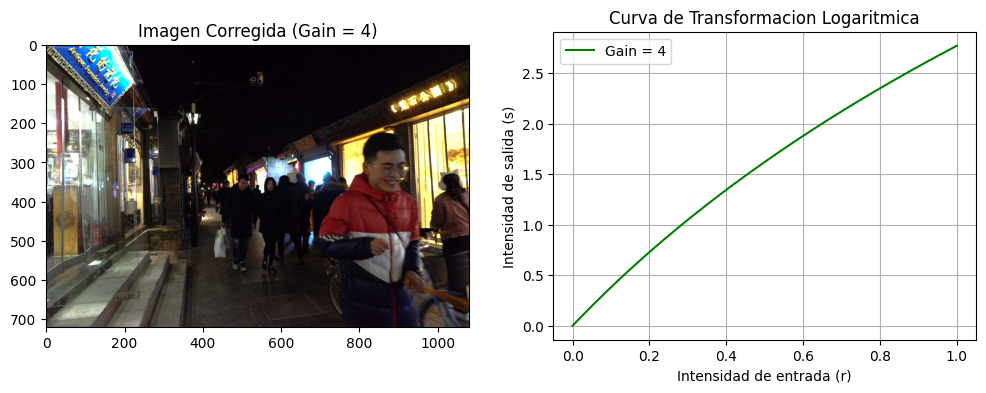

In [142]:
# Para primera imagen
transformacion_logaritmica("images/1.png",4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..12.0].


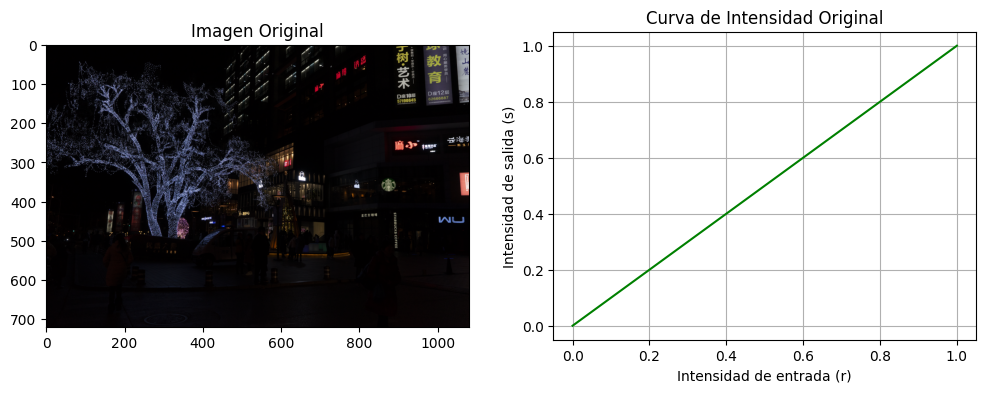

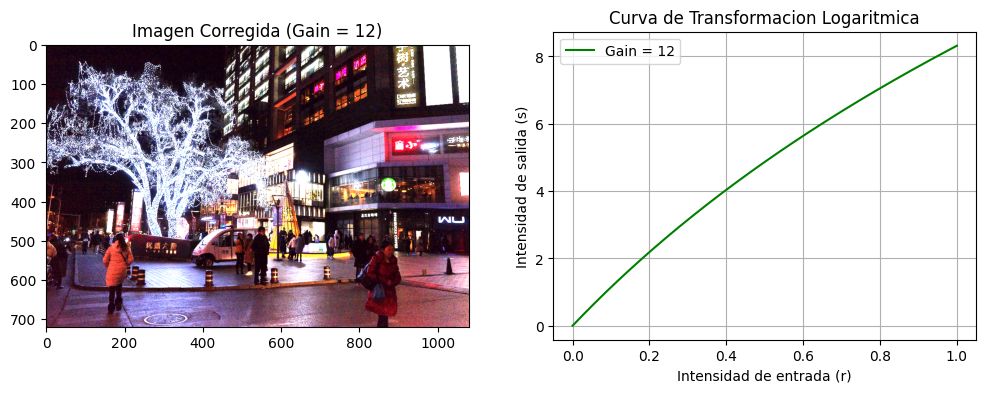

In [120]:
# Para segunda imagen
transformacion_logaritmica("images/1002.png",12)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.0].


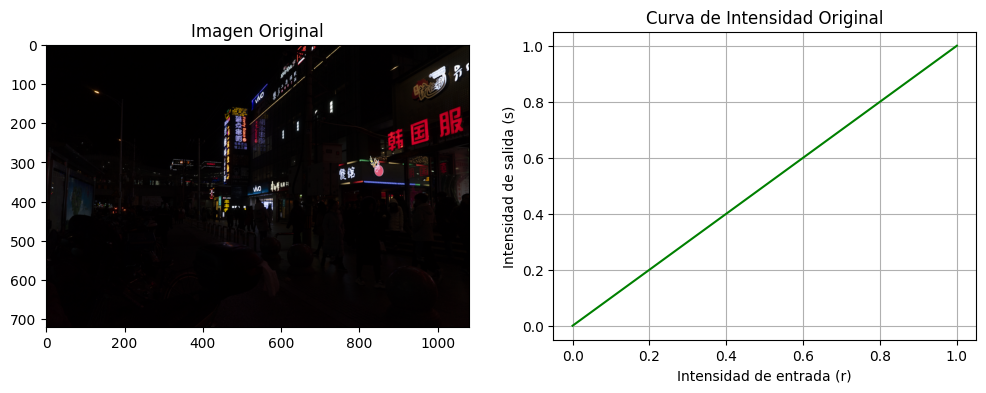

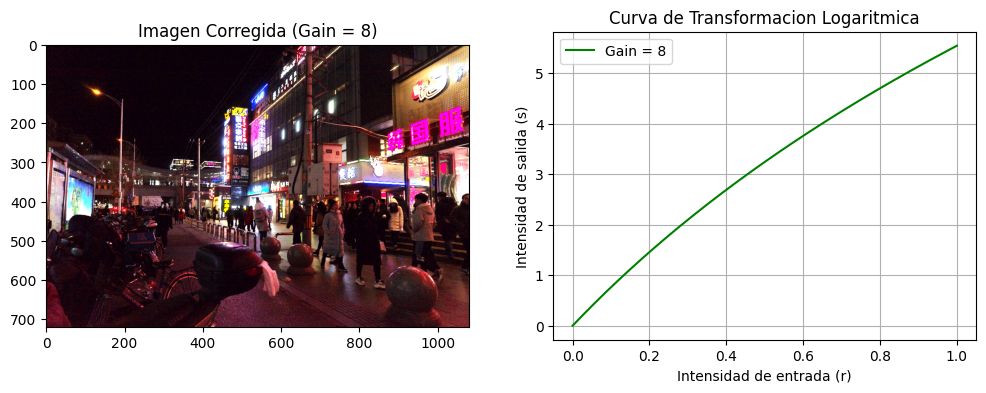

In [131]:
# Para tercera imagen 
transformacion_logaritmica("images/1006.png",8)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.0].


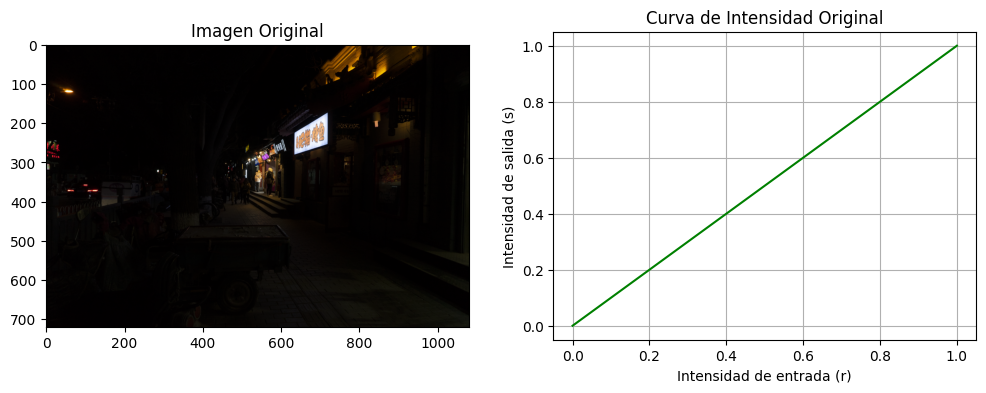

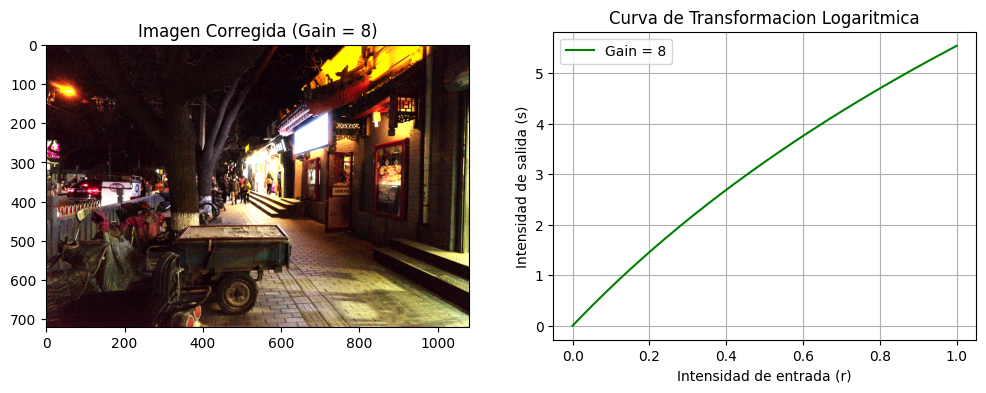

In [140]:
# Para cuarta imagen
transformacion_logaritmica("images/1011.png",8)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..19.0].


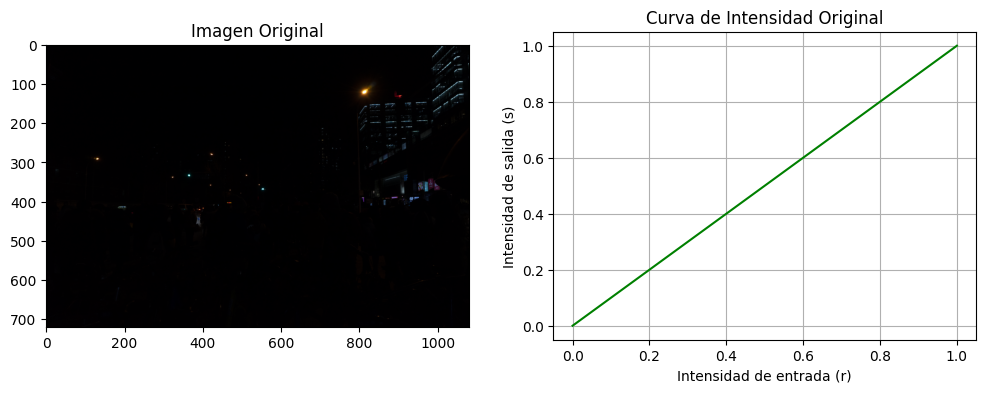

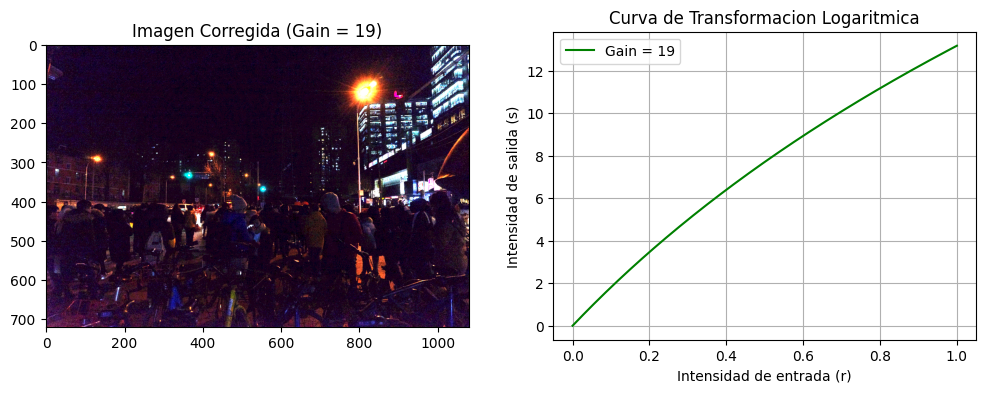

In [44]:
transformacion_logaritmica("images/1003.png",19)